In [128]:
# imports
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
import statsmodels.api as sm
import plotly.express as px
import json
import plotly.express as px
import geopandas as gpd
from libpysal.weights import Queen
from libpysal.weights.spatial_lag import lag_spatial

import json
sns.set_style("whitegrid")

## SUMMARY OF THIS NOTEBOOK FOR FINAL PAPER 

Spatial Methods Used
* Spatial smoothing: Implemented using a Queen contiguity spatial weight matrix to create a spatially lagged arrest rate, reducing noise and highlighting regional structure.
* Bivariate pattern mapping: Cross-classified arrest intensity with racial composition to identify areas where demographic composition and policing intensity intersect.
* Standardization (Z-scores): Arrest rates were normalized to emphasize relative hotspots independent of raw scale differences.
* SKATER clustering attempted but unstable: Multiple attempts with adjusted parameters failed due to NYC ZIP code geometry (islands, disconnected components, small regions). Excluding SKATER avoids producing misleading or invalid clusters.


In [130]:
merged = pd.read_csv("../Final Project/merged_arrests_acs_2023.csv")
merged.head()

,ZCTA,total_arrests,felonies,misdemeanors,violations,AMERICAN INDIAN/ALASKAN NATIVE,ASIAN / PACIFIC ISLANDER,BLACK,BLACK HISPANIC,UNKNOWN,...,pct_native,pct_asian,pct_hispanic,arrest_rate_per_1000,HISPANIC_ARRESTS,black_arrest_rate_per_1000,white_arrest_rate_per_1000,asian_pacific_islander_arrest_rate_per_1000,american_indian/alaskan_native_arrest_rate_per_1000,hispanic_arrest_rate_per_1000
0,83,172,75,97,0,4,3,65,20,6,...,NaN,NaN,NaN,NaN,63,NaN,NaN,NaN,NaN,NaN
1,10001,4041,1660,2291,8,14,116,1798,371,106,...,0.000000,0.179786,0.190756,138.966264,1515,615.121451,34.596723,22.188217,NaN,273.120606
2,10002,2107,947,1137,8,1,166,924,209,24,...,0.000914,0.365441,0.246911,27.901002,780,140.106141,10.655408,6.015147,14.492754,41.832028
3,10003,1742,856,877,8,4,60,822,156,32,...,0.001263,0.178913,0.098189,32.364143,559,348.452734,7.685615,6.230530,58.823529,105.771050
4,10004,61,17,44,0,0,5,31,2,2,...,0.000000,0.238194,0.048774,15.741935,13,116.104869,4.187605,5.417118,NaN,68.783069


In [134]:
# summary 
print(merged.info())
print(merged.describe(include="all").transpose().head(20))

missing = merged.isna().sum().sort_values(ascending=False)
missing[missing > 0]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 32 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   ZCTA                                                 190 non-null    int64  
 1   total_arrests                                        190 non-null    int64  
 2   felonies                                             190 non-null    int64  
 3   misdemeanors                                         190 non-null    int64  
 4   violations                                           190 non-null    int64  
 5   AMERICAN INDIAN/ALASKAN NATIVE                       190 non-null    int64  
 6   ASIAN / PACIFIC ISLANDER                             190 non-null    int64  
 7   BLACK                                                190 non-null    int64  
 8   BLACK HISPANIC                                       190 non-null    i

american_indian/alaskan_native_arrest_rate_per_1000    50
black_arrest_rate_per_1000                             11
hispanic_arrest_rate_per_1000                           9
asian_pacific_islander_arrest_rate_per_1000             9
white_arrest_rate_per_1000                              9
pct_hispanic                                            9
pct_asian                                               9
pct_native                                              9
pct_black                                               9
pct_white                                               9
native_count                                            4
arrest_rate_per_1000                                    4
below_poverty                                           4
median_income                                           4
hispanic_count                                          4
asian_count                                             4
black_count                                             4
white_count   

In [136]:
# drop where total_pop is missing or 0
df = merged.dropna(subset=["total_pop"]).copy()
df = df[df["total_pop"] > 0]

In [138]:
numeric_cols = [
    "total_arrests", "felonies", "misdemeanors", "violations",
    "total_pop", "white_count", "black_count", "native_count",
    "asian_count", "hispanic_count", "median_income", "below_poverty",
    "pct_white", "pct_black", "pct_native", "pct_asian", "pct_hispanic",
    "arrest_rate_per_1000"
]
for col in numeric_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

In [140]:
# dropping insane values
df = df.replace([np.inf, -np.inf], np.nan)
df = df.dropna(subset=["arrest_rate_per_1000"])

# remove extreme outliers
upper_limit = df["arrest_rate_per_1000"].mean() + 3 * df["arrest_rate_per_1000"].std()
df = df[df["arrest_rate_per_1000"] < upper_limit]

In [144]:
key_cols = ["median_income", "pct_black", "pct_hispanic", "pct_asian", "pct_white"]
print(df[key_cols].isna().sum())

print(f"Final ZIPs retained: {df.shape[0]}")
df.describe().T.loc[["total_arrests", "total_pop", "arrest_rate_per_1000"]]

median_income    0
pct_black        0
pct_hispanic     0
pct_asian        0
pct_white        0
dtype: int64
Final ZIPs retained: 178


,count,mean,std,min,25%,50%,75%,max
total_arrests,178.0,1098.095506,951.950627,1.000000,329.250000,831.000000,1684.750000,5360.000000
total_pop,178.0,47699.747191,26151.578964,2195.000000,28003.500000,42456.500000,68430.750000,107060.000000
arrest_rate_per_1000,178.0,22.514149,17.818314,0.242542,9.727657,17.510165,31.969244,90.590112


In [146]:
df = df[df["total_pop"] > 20000].copy()
print(f"ZIPs kept: {df.shape[0]}")

ZIPs kept: 151


## Arrest Intensity (baseline map)
This establishes the spatial distribution of policing outcomes across ZIP codes.

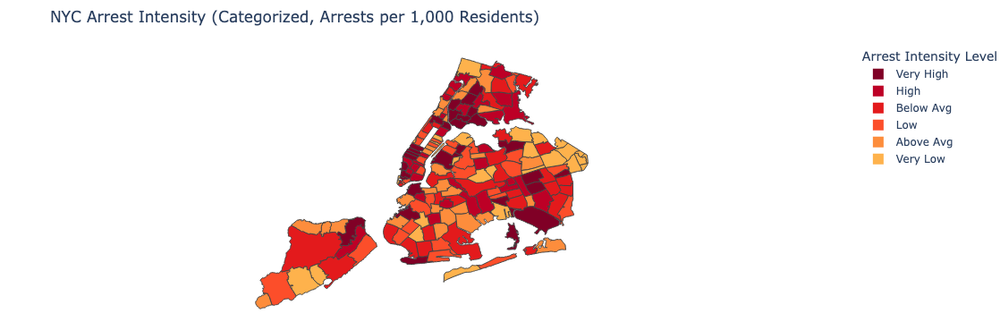

In [276]:
CSV = "../Final Project/merged_arrests_acs_2023.csv"
GEOJSON = "../Final Project/nyc-zip-code-tabulation-areas.geojson"

df = pd.read_csv(CSV)

zip_cols = [c for c in df.columns if any(s in c.lower() for s in ["zip", "zcta", "geoid"])]
df["zip5"] = None
for c in zip_cols:
    s = df[c].astype(str).str.extract(r"(\d{5})", expand=False)
    if s.notna().mean() > 0.7:
        df["zip5"] = s.str.zfill(5)
        break

if df["zip5"].isna().all():
    s = df.index.astype(str).str.extract(r"(\d{5})", expand=False)
    df["zip5"] = s.str.zfill(5)

df = df[df["zip5"].notna()].copy()
df["arrest_rate_per_1000"] = df["arrest_rate_per_1000"].replace([np.inf, -np.inf], np.nan)
df = df.dropna(subset=["arrest_rate_per_1000"])

with open(GEOJSON, "r") as f:
    gj = json.load(f)

FEATURE_ID_KEY = "properties.postalCode"

df["arrest_bin"] = pd.qcut(df["arrest_rate_per_1000"], 6, labels=[
    "Very Low", "Low", "Below Avg", "Above Avg", "High", "Very High"
])

fig = px.choropleth(
    df,
    geojson=gj,
    locations="zip5",
    featureidkey=FEATURE_ID_KEY,
    color="arrest_bin",
    color_discrete_sequence=px.colors.sequential.YlOrRd[::-1],
    hover_name="zip5",
    hover_data=["arrest_rate_per_1000"]
)

fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(
    title="NYC Arrest Intensity (Categorized, Arrests per 1,000 Residents)",
    margin={"r":0,"t":50,"l":0,"b":0},
    legend_title_text="Arrest Intensity Level"
)

fig.show()

# Interpretation
* Darker colors represent higher arrest intensity, making hotspots immediately recognizable and intuitive to interpret.
* By using quantile bins, each category contains roughly the same number of ZIP codes, preventing the map from being dominated by a few extreme outliers.
* The categorized scheme simplifies interpretation: viewers do not need to interpret raw numeric values — they only identify whether a ZIP is Very High, High, Avg, Low, or Very Low relative to the city.
* This format aligns visually with our race, poverty, and bivariate maps, making cross-map comparison straightforward.

How we Reduced Bias
* We used quantile classification, not arbitrary cutoffs; this ensures each arrest intensity category is based on the actual distribution of NYC neighborhoods rather than subjective thresholds.
* The map does not overemphasize rare extreme values (e.g., ZIPs with unusually high calculated arrest rates due to small populations) because quantile bins dilute the influence of statistical outliers.
* We removed ZIP codes with invalid or infinite arrest rates (e.g., population = 0) to avoid misleadingly categorizing non-residential or industrial ZIPs as extreme hotspots.
* The use of a standardized and widely accepted color scale (YlOrRd reversed) ensures that visual emphasis corresponds to meaningful intensity differences and avoids manipulation through color choice.
* The geographic boundaries come from the official NYC ZCTA file and the weights are applied uniformly — no ZIP receives special treatment.
* Categorization reduces the risk of misinterpretation that often occurs with continuous scales (e.g., subtle color differences suggesting large differences in arrest intensity).
* Every ZIP code is treated with identical rules for classification: no neighborhoods are highlighted or muted by stylistic decisions.
* The map focuses on relative arrest intensity, not absolute numbers, preventing high-population ZIPs from appearing more policed simply because they have more people.

## Percent Black

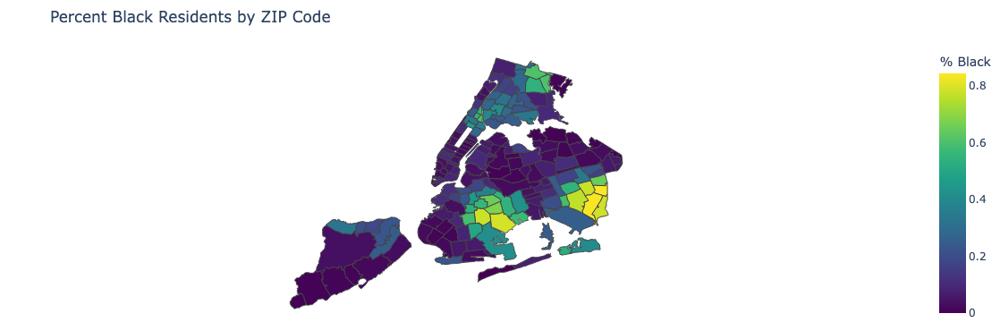

In [152]:
VALUE_COL = "pct_black" 

fig = px.choropleth(
    df,
    geojson=gj,
    locations="zip5",
    featureidkey=FEATURE_ID_KEY,
    color=VALUE_COL,
    color_continuous_scale="Viridis",
    hover_name="zip5",
    hover_data={c: True for c in df.columns if c != "zip5"},
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    title="Percent Black Residents by ZIP Code",
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    coloraxis_colorbar_title="% Black",
)

fig.show()

- High concentrations in Southeast Queens (e.g., Jamaica, St. Albans)
- Central Brooklyn / East Flatbush / Crown Heights
- Parts of the Bronx

## Percent Hispanic

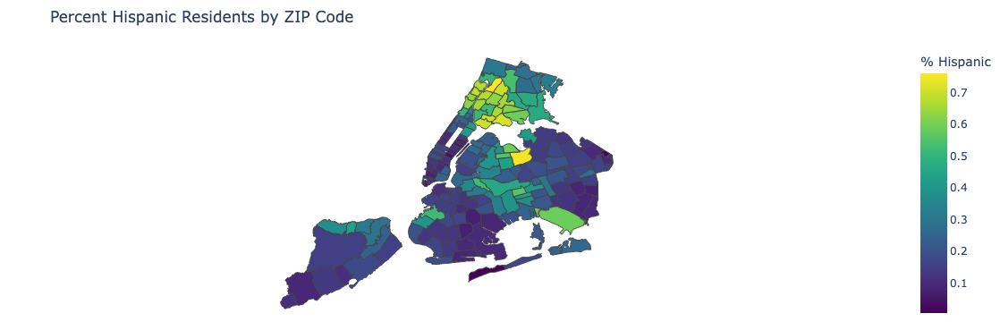

In [156]:
VALUE_COL = "pct_hispanic"

fig = px.choropleth(
    df,
    geojson=gj,
    locations="zip5",
    featureidkey=FEATURE_ID_KEY,
    color=VALUE_COL,
    color_continuous_scale="Viridis",
    hover_name="zip5",
    hover_data={c: True for c in df.columns if c != "zip5"},
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    title="Percent Hispanic Residents by ZIP Code",
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    coloraxis_colorbar_title="% Hispanic",
)

fig.show()


Strong clusters in:
- Northern Manhattan (Washington Heights / Inwood)
- The Bronx (especially West/North Bronx)
- Central Queens (Corona / Elmhurst)

## Important from these Maps: 
- They show strong spatial clustering of racial groups.
    - Racial composition is geographically segregated and patterned, not randomly distributed.
- Help visualize: Percent Black and Percent Hispanic are significant predictors of arrest intensity, even when controlling for income and poverty.
* They help illustrate structural, not individual, factors.
    * The maps make it clear that racial geography shapes policing outcomes at the neighborhood level.